In [1]:
from sectional_v2.util.plot.plot_maps import plot_map_diff, fix_axis4map_plot, plot_map_abs_abs_diff, plot_map, subplots_map, plot_map_diff_2case,plot_map_diff_only
from useful_scit.imps import (np, xr, plt, pd) 
from sectional_v2.util.imports import get_averaged_fields
from IPython.display import clear_output

# load and autoreload
from IPython import get_ipython

# noinspection PyBroadException
try:
    _ipython = get_ipython()
    _magic = _ipython.magic
    _magic('load_ext autoreload')
    _magic('autoreload 2')
except:
    pass

/home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME/
/home/ubuntu/mnts/nird/projects/SECTIONAL_v2/sectional_v2/data_info/area_defs.csv
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Ideas:
- Root mean square diffence??
- Scatter plots of all values, e.g x-- sectional y-- non sectional color by lat/lev? Or lev lat difference. 

# Map plots number concentration:

In [2]:
model = 'NorESM'

startyear = '2008-01'
endyear = '2010-12'
p_level=1013.
pmin = 850.  # minimum pressure level
avg_over_lev = True  # True#True#False#True
pressure_adjust = True  # Can only be false if avg_over_lev false. Plots particular hybrid sigma lev
if avg_over_lev:
    pressure_adjust = True
p_levels = [1013.,900., 800., 700., 600.]  # used if not avg

In [3]:
from sectional_v2.constants import get_plotpath
from sectional_v2.util.practical_functions import make_folders
version='v21dd_both'
plot_path = get_plotpath('maps')
filen_base = plot_path+'/_%s'%version
#print(plot_path)
make_folders(plot_path)

## Cases

In [4]:
#cases_sec = ['SECTv21_ctrl']
#cases_orig =['noSECTv21_default'] 
#cases_orig =['noSECTv21_ox_ricc']
to_case = 'SECTv21_ctrl_koagD'
from_cases = ['noSECTv21_default_dd','noSECTv21_ox_ricc_dd']
cases =[to_case]+from_cases

In [5]:
from sectional_v2.constants import get_plotpath
from sectional_v2.util.practical_functions import make_folders

#plot_path = get_plotpath('maps')
#filen_base = plot_path+'/_%s'%version
#print(plot_path)
#make_folders(plot_path)

In [6]:
def load_and_plot(var, cases,startyear, endyear, period=None,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=None, relative=False):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    clear_output()
    return plot_map_abs_abs_diff(var, cases, maps_dic, relative=relative, figsize=[18, 3], cbar_equal=True,
                          kwargs_abs={},
                          kwargs_diff={}, axs=None, cmap_abs='Reds', cmap_diff='RdBu_r')
    


In [7]:
def load_and_plot_rows(varl, cases,startyear, endyear, period=None,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=None, relative=False):
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev, time_mask=period,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    fig, axs = subplots_map(len(varl), 3, figsize=[18,3*len(varl)])
    ii=0
    for var in varl:
        axss= axs[ii,:]
        ii+=1
        plot_map_abs_abs_diff(var, cases, maps_dic, relative=relative, figsize=[18, 3], cbar_equal=True,
                          kwargs_abs={}, axs=axss,
                          kwargs_diff={}, cmap_abs='Reds', cmap_diff='RdBu_r')
    
    return axs

In [8]:
def load_and_plot_diff(varl, cases,startyear, endyear,
                       avg_over_lev=avg_over_lev,
                       pmin=pmin,nr_cols=2,
                       pressure_adjust=pressure_adjust, 
                       p_level=None, 
                       period=None,
                       relative=False,
                      width=5.):
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev, time_mask=period,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    plot_diff(maps_dic, varl, cases,nr_cols=nr_cols, relative=relative, width=width, period=None)
    return


def plot_diff(maps_dic, varl, cases,nr_cols=2, relative=False, width=5., axs=None, period=None):
    #fig, axs = subplots_map(int(np.ceil(len(varl)/2)), 2, figsize=[10,4*len(varl)])
    if axs is None:
        nr_rows = int(np.ceil(len(varl)/nr_cols))
        print(nr_rows)
        fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,2.5*nr_rows])#7*nr_cols,3*nr_rows])
    for var, ax in zip(varl, axs.flatten()):
        plot_map_diff_2case(var,cases[0],cases[1], maps_dic, relative=relative, 
                               ax=ax, cmap_diff='RdBu_r')



In [9]:
def load_and_plot_diff_mm(varl,to_case,from_cases,startyear, endyear,
                       avg_over_lev=avg_over_lev,
                       pmin=pmin,nr_cols=2,
                       pressure_adjust=pressure_adjust, 
                       p_level=None, 
                       relative=False,
                      width=6., height=2.3):
    cases = [to_case] + from_cases
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    nr_rows = int(np.ceil(len(varl)/nr_cols))
    nr_cols = len(from_cases)
    fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,height*nr_rows])
    
    for i, var in enumerate(varl):
        if len(varl) == 1: saxs = axs 
        else: saxs = axs[i,:]
        plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       cbar_loc='side', tight_layout=False, inverse_diff=True, axs=saxs)


    
    #for from_case,i in zip(from_cases,range(nr_cols)):
    #    sax = axs[:,i]
    #    plot_diff(maps_dic, varl, [from_case,to_case],nr_cols=nr_cols, relative=relative, width=width, axs=sax)
        
    subp_insert_abc(axs, pos_y=0.1)
    return




## Mean to 850hPa weighted by pressure difference:

### CCN:

In [10]:
from useful_scit.plot.fig_manip import subp_insert_abc

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTNL_incld_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTREL_incld_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/TGCLDCWP_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCFT_Ghan_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTNL_incld_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTREL_incld_2008-01-2010-12_JJA_lev_not_dim.nc
Loa

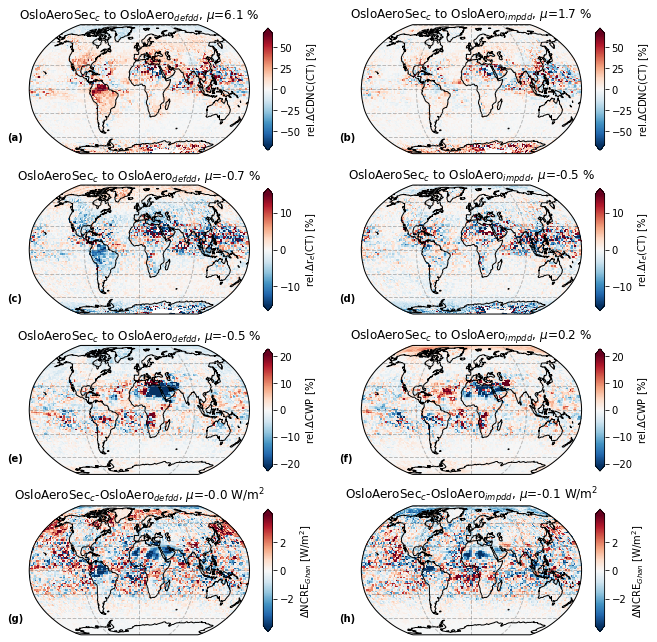

In [11]:
varl_rel = ['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']
varl_abs=['NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']
period='JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])
for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTNL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTREL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/TGCLDCWP_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCFT_Ghan_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTNL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTREL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loa

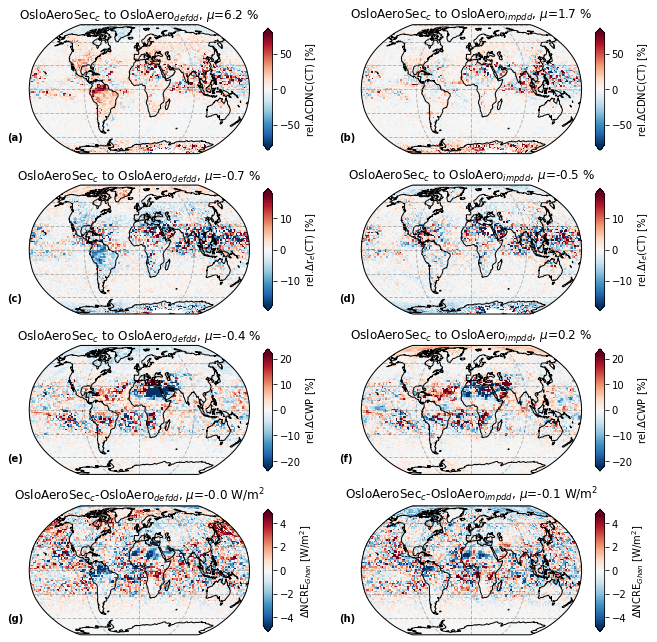

In [23]:
varl_rel = ['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']
varl_abs=['NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']
period='JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])
for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTNL_incld_2008-01-2009-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTREL_incld_2008-01-2009-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/TGCLDCWP_2008-01-2009-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCFT_Ghan_2008-01-2009-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTNL_incld_2008-01-2009-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTREL_incld_2008-01-2009-12_DJF_lev_not_dim.nc
Loa

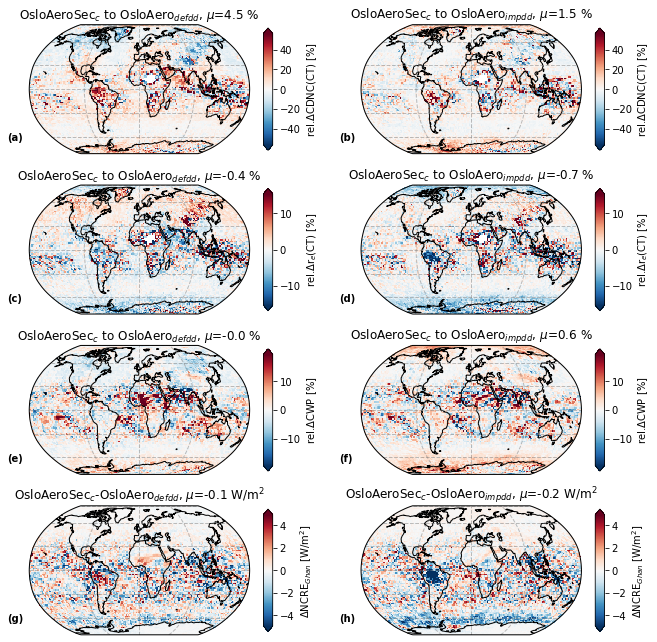

In [22]:
varl_rel = ['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']
varl_abs=['NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']
period='DJF'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])
for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTNL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTNL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/ACTNL_incld_2008-01-2009-12_JJA_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTNL_incld_2008-01-2009-12_SON_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/ACTNL_incld_2008-01-2009-12_SON_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ri

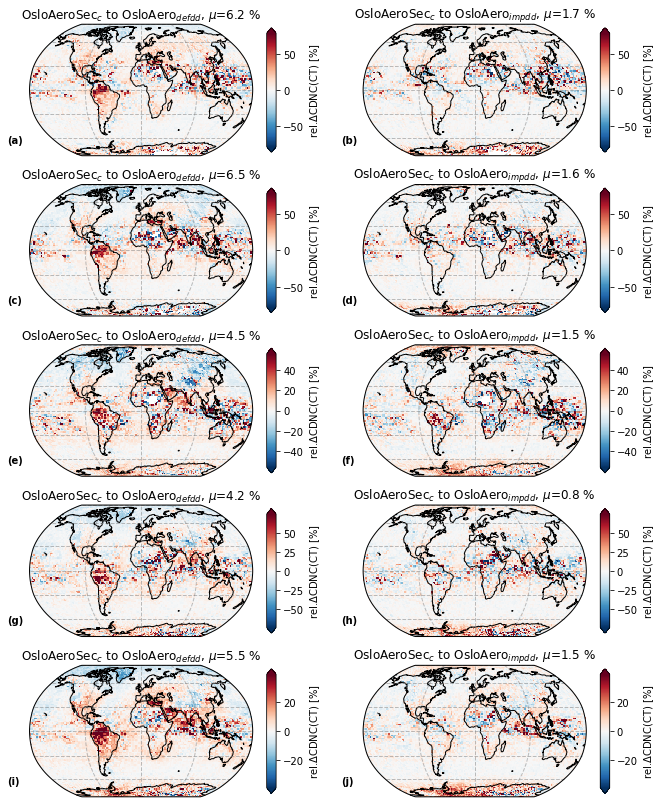

In [39]:
var='ACTNL_incld'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','SON','DJF','MAM',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2010-12_JJA_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2010-12_JJA_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2010-12_JJA_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
0 JJA
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2010-12_DJF_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2010-12_DJF_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2010-12_D

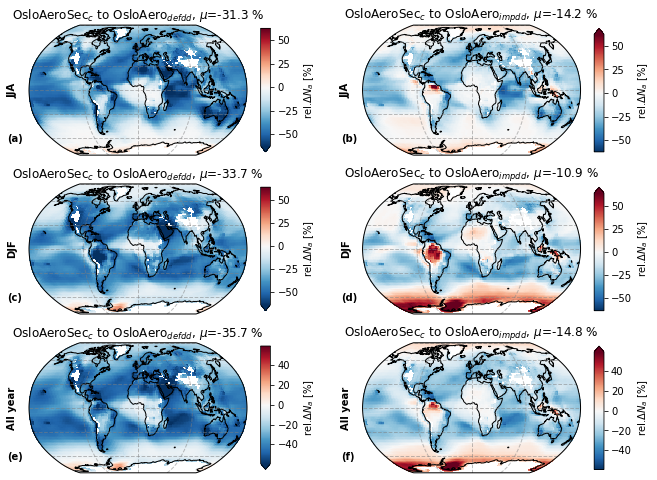

In [27]:
var='N_AER'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','DJF',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


    #axs[i,0].text(x=x_text_annotation, y=670000, s='Holiday in US', alpha=0.7, color='#334f8d'))
    if period is None: pper = 'All year'
    else: pper = period
    print(i, period)
    for ax in saxs:
        ax.text(-.1,y=.5,
                verticalalignment='center', s=pper, transform=ax.transAxes, rotation=90, weight='bold')
    #axs[i,1].text(-.1,y=.1, s=pper, transform=ax.transAxes) #, weight='bold'
    
    #for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')
subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTLN_incld_2008-01-2010-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/ACTLN_incld_2008-01-2010-12_JJA_lev_not_dim.nc
<xarray.DataArray 'time' (time: 36)>
array([ 396.,  425.,  456.,  486.,  517.,  547.,  578.,  609.,  639.,  670.,
        700.,  731.,  762.,  790.,  821.,  851.,  882.,  912.,  943.,  974.,
       1004., 1035., 1065., 1096., 1127., 1155., 1186., 1216., 1247., 1277.,
       1308., 1339., 1369., 1400., 1430., 1461.])
Coordinates:
  * time     (time) float64 396.0 425.0 456.0 ... 1.4e+03 1.43e+03 1.461e+03
Attributes:
    long_name:  time
    units:      days since 2007-01-01 00:00:00
    calendar:   gregorian
    bounds:     time_bnds
<xarray.DataArray 'time' (time: 36)>
array(['2008-01-17T00:00:00.000000000', '2008-02-15T00:00:00.000000000',
    

KeyError: 'ACTLN_incld'

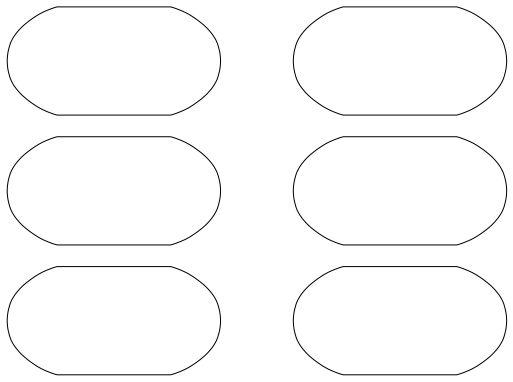

In [31]:
var='ACTLN_incld'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','DJF',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


    #axs[i,0].text(x=x_text_annotation, y=670000, s='Holiday in US', alpha=0.7, color='#334f8d'))
    if period is None: pper = 'All year'
    else: pper = period
    print(i, period)
    for ax in saxs:
        ax.text(-.1,y=.5,
                verticalalignment='center', s=pper, transform=ax.transAxes, rotation=90, weight='bold')
    #axs[i,1].text(-.1,y=.1, s=pper, transform=ax.transAxes) #, weight='bold'
    
    #for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')
subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2010-12_JJA_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCONC01_2008-01-2010-12_JJA_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NCONC01_2008-01-2010-12_JJA_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
0 JJA
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2010-12_DJF_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCONC01_2008-01-2010-12_DJF_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NCONC01_2008-

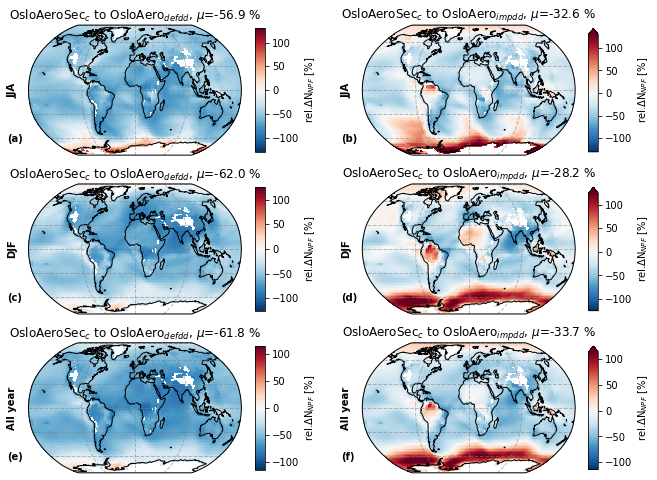

In [28]:
var='NCONC01'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','DJF',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


    #axs[i,0].text(x=x_text_annotation, y=670000, s='Holiday in US', alpha=0.7, color='#334f8d'))
    if period is None: pper = 'All year'
    else: pper = period
    print(i, period)
    for ax in saxs:
        ax.text(-.1,y=.5,
                verticalalignment='center', s=pper, transform=ax.transAxes, rotation=90, weight='bold')
    #axs[i,1].text(-.1,y=.1, s=pper, transform=ax.transAxes) #, weight='bold'
    
    #for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')
subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_NA_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_NA_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_NA_2008-01-2010-12_JJA_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
0 JJA
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_NA_2008-01-2010-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_NA_2008-01-2010-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_NA_2008-01-2010

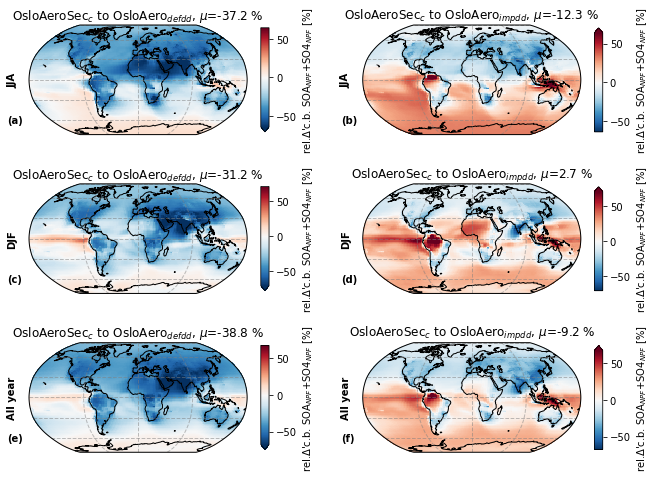

In [30]:
var='cb_NA'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','DJF',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


    #axs[i,0].text(x=x_text_annotation, y=670000, s='Holiday in US', alpha=0.7, color='#334f8d'))
    if period is None: pper = 'All year'
    else: pper = period
    print(i, period)
    for ax in saxs:
        ax.text(-.1,y=.5,
                verticalalignment='center', s=pper, transform=ax.transAxes, rotation=90, weight='bold')
    #axs[i,1].text(-.1,y=.1, s=pper, transform=ax.transAxes) #, weight='bold'
    
    #for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')
subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2010-12_JJA_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2010-12_JJA_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
0 JJA
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2010-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2010-12_DJF_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_d

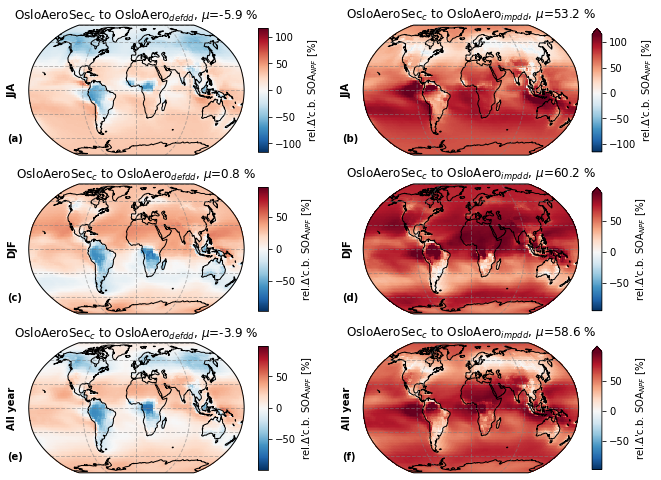

In [29]:
var='cb_SOA_NA'#l_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
    
periods=['JJA','DJF',None]#'JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(periods)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])

for i,period in enumerate(periods):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=relative, cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)


    #axs[i,0].text(x=x_text_annotation, y=670000, s='Holiday in US', alpha=0.7, color='#334f8d'))
    if period is None: pper = 'All year'
    else: pper = period
    print(i, period)
    for ax in saxs:
        ax.text(-.1,y=.5,
                verticalalignment='center', s=pper, transform=ax.transAxes, rotation=90, weight='bold')
    #axs[i,1].text(-.1,y=.1, s=pper, transform=ax.transAxes) #, weight='bold'
    
    #for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')
subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    NCONC01  (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-20

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONA

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SE

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_JJA_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_JJA_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SE

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
/home/ubuntu/mnts/nird/projects//Plots_SECTIONAL_SCHEME/maps//_v21dd_bothNCONC01_N_AER_cb_SOA_NA_cb_SO4_NATrue_JJA.


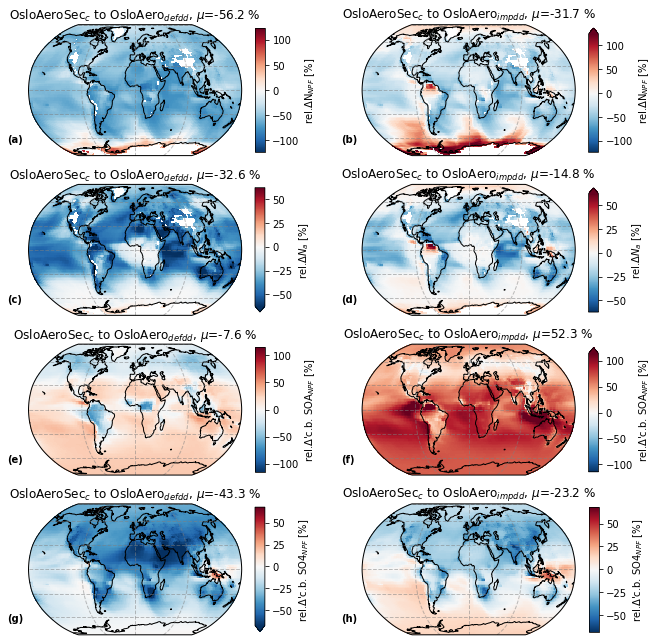

In [25]:
varl_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
varl_abs=[]#'NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']
period='JJA'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])
for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    NCONC01  (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-20

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONA

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SE

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:  (lat: 96, lev: 32, lon: 144, time: 24)
Coordinates:
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * time     (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    N_AER    (time, lev, lat, lon) float64 dask.array<chunksize=(24, 32, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_DJF_lev_not_dim.nc
<xarray.Dataset>
Dimensions:    (lat: 96, lon: 144, time: 24)
Coordinates:
  * lon        (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat        (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
  * time       (time) datetime64[ns] 2008-01-17 2008-02-15 ... 2009-12-17
Data variables:
    cb_SOA_NA  (time, lat, lon) float32 dask.array<chunksize=(24, 96, 144), meta=np.ndarray>
Did not find map mean with filename: /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_DJF_avg2lev850.nc or  /home/ubuntu/mnts/nird/projects//Output_data_SE

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
/home/ubuntu/mnts/nird/projects//Plots_SECTIONAL_SCHEME/maps//_v21dd_bothNCONC01_N_AER_cb_SOA_NA_cb_SO4_NATrue_DJF.


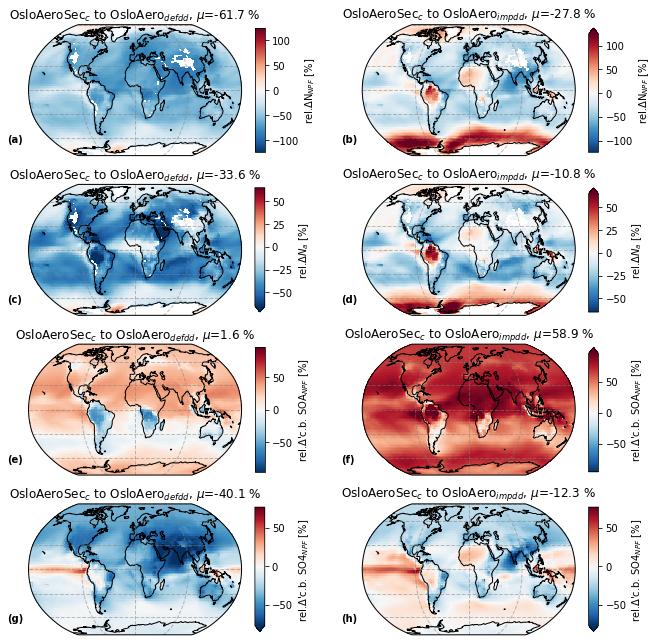

In [24]:
varl_rel = ['NCONC01','N_AER','cb_SOA_NA','cb_SO4_NA']
varl_abs=[]#'NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']
period='DJF'
                        
width=4.7
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin, time_mask=period,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])
for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip(from_cases,range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,to_case, maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')

subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}_{period}.'
print(fn)
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/AWNC_incld_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/AREL_incld_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/TGCLDCWP_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCFT_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/AWNC_incld_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/AREL_incld_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/p

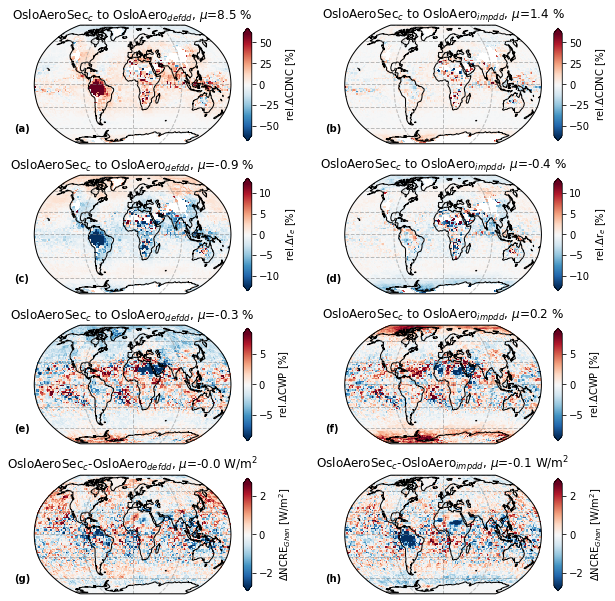

In [12]:
varl_rel = ['AWNC_incld', 'AREL_incld','TGCLDCWP']
varl_abs=['NCFT_Ghan']#,'TGCLDCWP']
varl = varl_rel+varl_abs
    
#varl=['ACTNL_incld', 'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']

                        
width=4.4
asp_rat = 0.48
relative=True

cases = [to_case] + from_cases
maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
nr_cols = len(from_cases)
nr_rows = int(np.ceil(len(varl)))
fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,asp_rat*width*nr_rows])


for i, var in enumerate(varl):
    saxs = axs[i,:] 
    plot_map_diff_only(var, [to_case,*from_cases], maps_dic, relative=(var in varl_rel), cbar_equal=True,
                       kwargs_diff={}, axs=saxs, cmap_diff='RdBu_r',
                       cbar_loc='side', tight_layout=False, inverse_diff=True)

#for from_case,i in zip([to_case, from_cases[-1]],range(nr_cols)):
#    sax = axs[:,i]
#    for var, ax in zip(varl, sax.flatten()):
#        plot_map_diff_2case(var, from_case,from_cases[0], maps_dic, relative=(var in varl_rel), 
#                               ax=ax, cmap_diff='RdBu_r')


subp_insert_abc(axs, pos_y=0.1)

#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
#load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
['noSEC

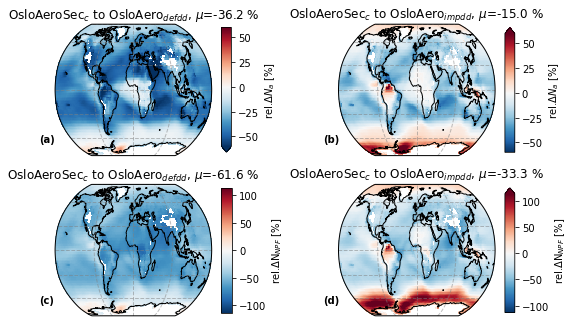

In [13]:

varl=['N_AER','NCONC01']#,'LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, 
                      relative=relative, 
                      pressure_adjust=pressure_adjust,
                      nr_cols=1, 
                      width=4)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')
print(fn)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
/home/ubuntu/mnts/nird/projects//Plots_SECTIONAL_SCHEME/maps//_v21dd_bothDIR_GhanFalse.


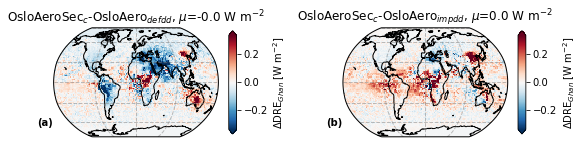

In [14]:

    
varl=['DIR_Ghan']#,'LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, 
                      endyear, 
                      avg_over_lev,  
                      pmin=pmin, 
                      relative=relative, 
                      pressure_adjust=pressure_adjust,
                      nr_cols=1, 
                      width=4.1,
                     height=2.1)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf', dpi=300)
print(fn)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/CDOD550_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/CDOD550_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/CDOD550_2008-01-2009-12_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
/home/ubuntu/mnts/nird/projects//Plots_SECTIONAL_SCHEME/maps//_v21dd_bothCDOD550False.


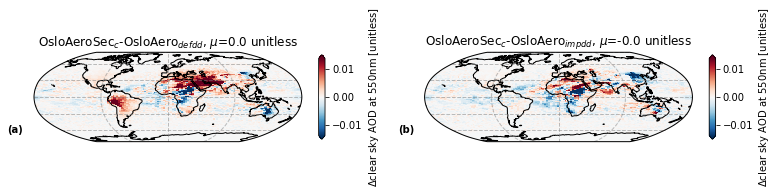

In [15]:

    
varl=['CDOD550']#,'LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, 
                      relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')
print(fn)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NMR01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NMR01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NMR01_2008-01-2009-12_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
['noSEC

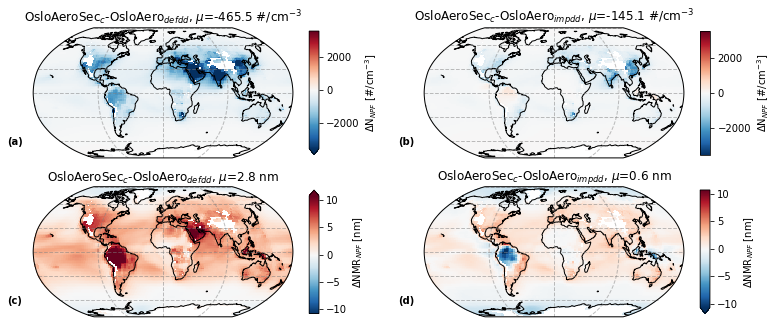

In [16]:

    
varl=['NCONC01','NMR01']#,'LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, 
                      relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')
print(fn)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SO4_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SO4_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projec

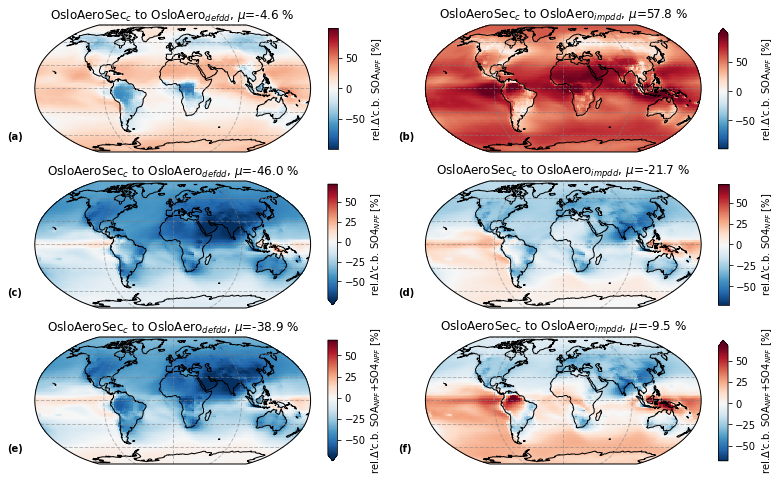

In [36]:

    
varl=['cb_SOA_NA','cb_SO4_NA', 'cb_NA']#,'LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, 
                      relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
#plt.savefig(fn + 'png')
#plt.savefig(fn + 'pdf')
print(fn)

In [18]:
maps_dic = get_averaged_fields.get_maps_cases(cases,['DIR_Ghan'],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/DIR_Ghan_2008-01-2009-12_lev_not_dim.nc


In [19]:
cases

['SECTv21_ctrl_koagD', 'noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']

In [20]:
maps_dic[cases[0]]['DIR_Ghan']

<xarray.DataArray 'DIR_Ghan' (lat: 96, lon: 144)>
array([[-0.013956, -0.014071, -0.014141, ..., -0.013685, -0.01375 , -0.013842],
       [-0.002531, -0.002152, -0.001331, ..., -0.006985, -0.005489, -0.003856],
       [-0.015331, -0.009338, -0.0004  , ..., -0.037364, -0.030876, -0.023386],
       ...,
       [ 0.136401,  0.139561,  0.14211 , ...,  0.132514,  0.131651,  0.133862],
       [ 0.119959,  0.123696,  0.126911, ...,  0.116891,  0.117094,  0.116861],
       [ 0.098549,  0.099102,  0.099253, ...,  0.09885 ,  0.098845,  0.098595]])
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
Attributes:
    Sampling_Sequence:  rad_lwsw
    units:              W/m^2
    long_name:          Net longwave flux at top of model
    cell_methods:       time: mean
    pressure_coord:     False
    raw_data_path:      /home/ubuntu/mnts/nird/projects/model_output/archive/
    model:              NorESM
    model_name:         NorESM
    case_name:          SECTv21_ctrl_koagD
    case:               SECTv21_ctrl_koagD
    case_name_nice:     SECTv21_ctrl_koagD
    isSectional:        False
    from_time:          2008-01
    to_time:            2009-12
    startyear:          2008
    endyear:            2009
    pressure_coords:    True
    area:               Global
    Calc_weight_mean:   False map

In [21]:
dff_ = maps_dic[cases[1]][['DIR_Ghan']]- maps_dic[cases[0]][['DIR_Ghan']]#['DIR_Ghan']
print(cases[1])

noSECTv21_default_dd


In [22]:
dff2_ = maps_dic[cases[2]][['DIR_Ghan']]- maps_dic[cases[0]][['DIR_Ghan']]#['DIR_Ghan']
print(cases[2])

noSECTv21_ox_ricc_dd


In [23]:
from sectional_v2.util.slice_average.avg_pkg import average_model_var

In [24]:
average_model_var(dff_, 'DIR_Ghan', area='Global')

<xarray.Dataset>
Dimensions:   (lat: 96, lon: 144)
Coordinates:
  * lon       (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat       (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
Data variables:
    DIR_Ghan  float64 0.02145
    Global    (lat, lon) bool False False False False ... False False False

In [25]:
average_model_var(dff2_, 'DIR_Ghan', area='Global')

<xarray.Dataset>
Dimensions:   (lat: 96, lon: 144)
Coordinates:
  * lon       (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
  * lat       (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 86.21 88.11 90.0
Data variables:
    DIR_Ghan  float64 -0.02478
    Global    (lat, lon) bool False False False False ... False False False

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/LWDIR_Ghan_2008-01-2009-12_lev_not_dim.nc
['noSECTv21_default_dd', '

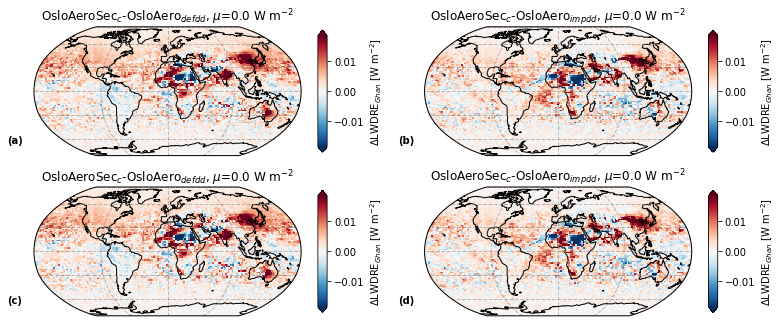

In [26]:

    
varl=['LWDIR_Ghan','LWDIR_Ghan']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SOA_NA_totLossR_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SOA_NA_totLossR_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SOA_NA_totLossR_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim

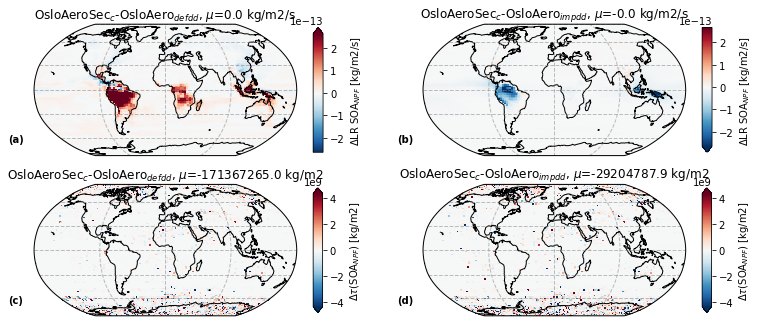

In [27]:

    
varl=['SOA_NA_totLossR','SOA_NA_lifetime']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SOA_NA_lifetime_2008-01-2009-12_lev_not_dim

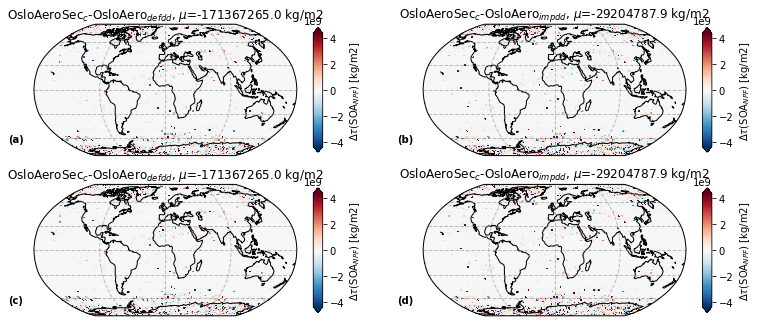

In [28]:

    
varl=['SOA_NA_lifetime','SOA_NA_lifetime']#'LWDIR_Ghan']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
[

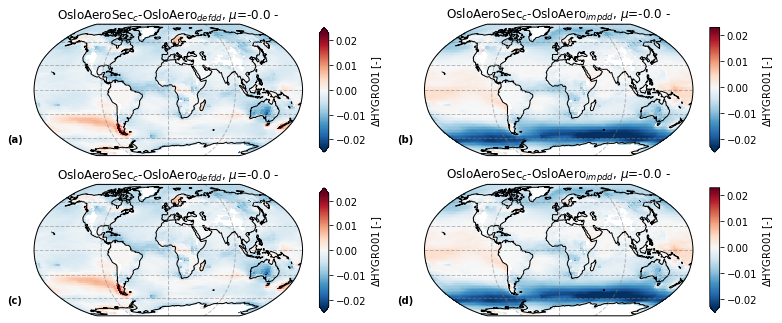

In [29]:

    
varl=['HYGRO01','HYGRO01']#, 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/HYGRO01_2008-01-2009-12_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
[

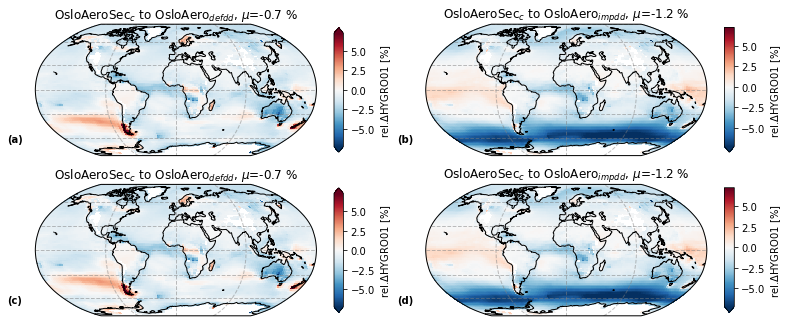

In [30]:

    
varl=['HYGRO01', 'HYGRO01']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SOA_NAcondTend_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SO4_NAcondTend_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SOA_NAcondTend_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SO4_NAcondTend_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SOA_NAcondTend_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/SO4_NAcondTend_2008-01-2009-12_lev_not_dim.nc
['

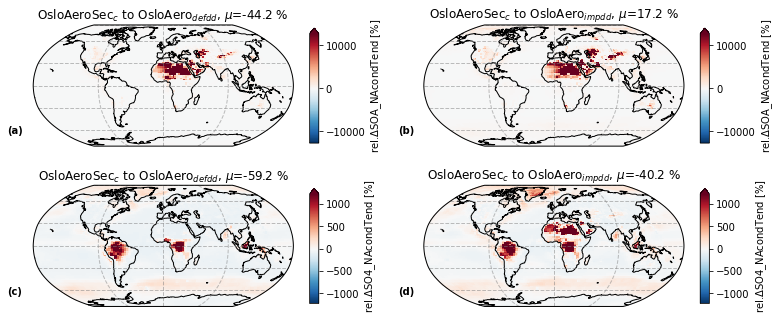

In [31]:

    
varl=['SOA_NAcondTend', 'SO4_NAcondTend']#, 'leaveSecH2SO4','leaveSecSOA']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/SWCF_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/LWCF_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCFT_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/SWCF_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/LWCF_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCFT_Ghan_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nir

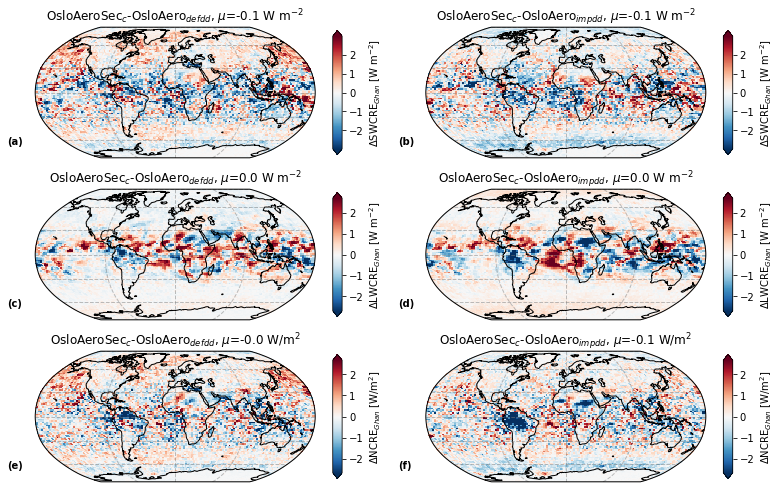

In [32]:

    
varl=['SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan']#'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']

relative=False
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SO4_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SOA_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/cb_SO4_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SOA_NA_2008-01-2009-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/cb_SO4_NA_2008-01-2009-12_lev_not_dim.nc
['noSECTv21_default_dd', 'noSECT

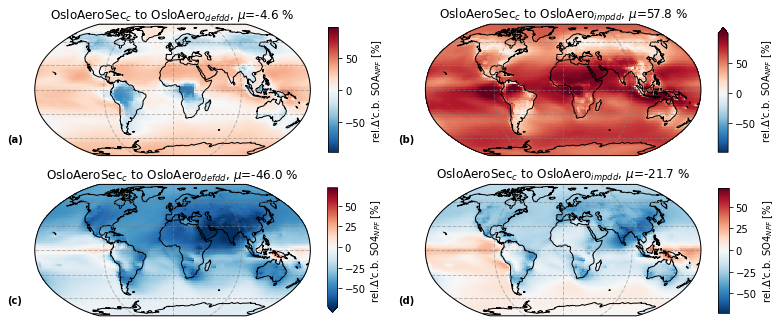

In [33]:

    
varl=['cb_SOA_NA', 'cb_SO4_NA']#, 'NCFT_Ghan']#'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/N_AER_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_ox_ricc_dd/NCONC01_2008-01-2009-12_avg2lev850.nc
['noSECTv21_default_dd', 'noSECTv21_ox_ricc_dd']
['noSEC

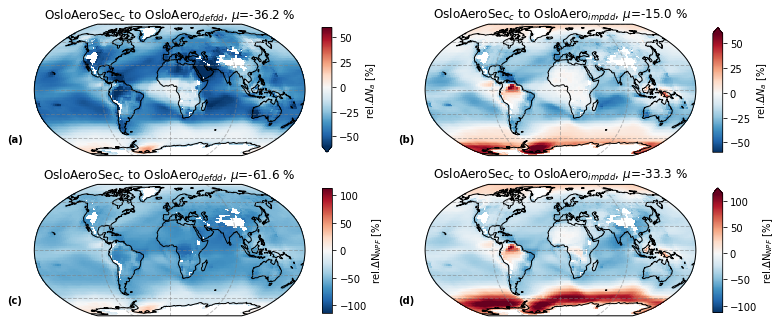

In [34]:

    
varl=['N_AER', 'NCONC01']#, 'NCFT_Ghan']#'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'

plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/FORMRATE_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/GR_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/SECTv21_ctrl_koagD/COAGNUCL_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/FORMRATE_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/GR_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECTIONAL_SCHEME//means/map_means//NorESM/noSECTv21_default_dd/COAGNUCL_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_

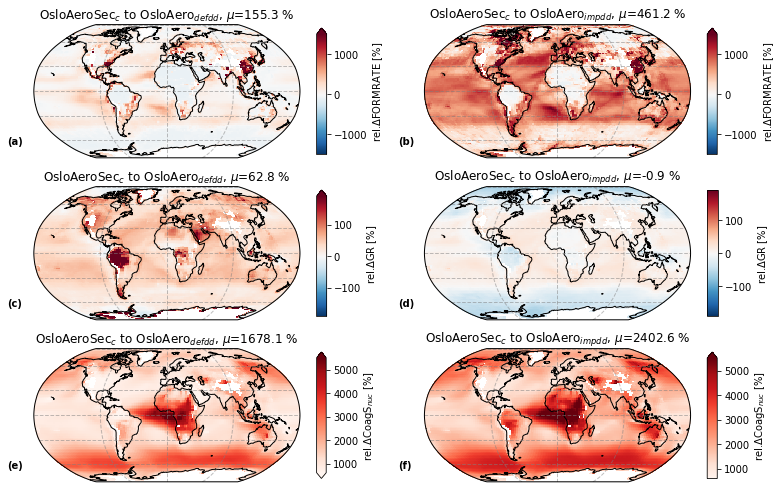

In [35]:

    
varl=['FORMRATE', 'GR','COAGNUCL']#, 'NCFT_Ghan']#'ACTREL_incld','TGCLDCWP']#,'TGCLDCWP']

relative=True
#plot_diff(maps_dic, varl, cases[::-1],nr_cols=1, relative=relative)
load_and_plot_diff_mm(varl,to_case,from_cases, startyear, endyear, avg_over_lev,  pmin=pmin, relative=relative, pressure_adjust=pressure_adjust,nr_cols=1, width=5.5)
fn = filen_base + '_'.join(varl)+f'{relative}.'
plt.tight_layout()
plt.savefig(fn + 'png')
plt.savefig(fn + 'pdf')